## Analyze DG simulations from 31 March 

In [1]:
import xarray as xr
import xrft
import matplotlib.pyplot as plt
import numpy as np
from xgcm import Grid

In [2]:
from datatree import open_datatree, DataTree 

In [3]:
import sys
sys.path.append('../modules/')

In [17]:
%reload_ext autoreload
%autoreload 2

from prepare_experiments import load_config

import DG_sim_analysis_modules as sam

In [33]:
# Load HR model
dir_HR = '/scratch/db194/mom6/base_experiments_2025/DoubleGyre/double_gyre_HR/'

ds_HR = {}
ds_HR['prog'] = xr.open_mfdataset(dir_HR+'prog_*.nc', decode_times=False)
ds_HR['oce_stats'] = xr.open_dataset(dir_HR +'ocean.stats.nc', decode_times=False)

In [42]:
ds_HR['prog']

<xarray.Dataset>
Dimensions:  (xq: 441, yh: 400, zl: 2, Time: 720, xh: 440, yq: 401, zi: 3)
Coordinates:
  * xq       (xq) float64 0.0 0.05 0.1 0.15 0.2 ... 21.8 21.85 21.9 21.95 22.0
  * yh       (yh) float64 30.02 30.07 30.12 30.18 ... 49.83 49.88 49.92 49.98
  * zl       (zl) float64 1.035e+03 1.036e+03
  * Time     (Time) float64 5.0 10.0 15.0 20.0 ... 3.59e+03 3.595e+03 3.6e+03
  * xh       (xh) float64 0.025 0.075 0.125 0.175 ... 21.83 21.88 21.93 21.98
  * yq       (yq) float64 30.0 30.05 30.1 30.15 30.2 ... 49.85 49.9 49.95 50.0
  * zi       (zi) float64 1.034e+03 1.036e+03 1.037e+03
Data variables:
    u        (Time, zl, yh, xq) float32 dask.array<chunksize=(73, 2, 400, 441), meta=np.ndarray>
    v        (Time, zl, yq, xh) float32 dask.array<chunksize=(73, 2, 401, 440), meta=np.ndarray>
    h        (Time, zl, yh, xh) float64 dask.array<chunksize=(73, 2, 400, 440), meta=np.ndarray>
    e        (Time, zi, yh, xh) float32 dask.array<chunksize=(73, 3, 400, 440), meta=np.ndarray>
    RV       (Time, zl, yq, xq) float32 dask.array<chunksize=(73, 2, 401, 441), meta=np.ndarray>
Attributes:
    filename:   prog__0001_006.nc
    title:      MOM Experiment
    grid_type:  regular
    grid_tile:  N/A

In [5]:
res = [10, 20, 40, 80]
C_ANN = np.array([0.0, 0.25, 0.5, 0.75, 1.0])
C_GM = np.array([10, 50, 100, 200, 500])/1000
model_types = ['ANN', 'GM1000']

In [6]:
exp_dir = '/scratch/db194/mom6/base_experiments_2025/DoubleGyre/31Mar/'

In [ ]:
exp_tree = sam.load_sims(exp_dir, model_types, res, C_ANN, C_GM)

In [19]:
exp_stats = sam.load_sims(exp_dir, model_types, res, C_ANN, C_GM, files_to_load=['oce_stats'])

Reading :res_10km_ANN_0.0
Reading :res_10km_ANN_0.25
Reading :res_10km_ANN_0.5
Reading :res_10km_ANN_0.75
Reading :res_10km_ANN_1.0
Reading :res_20km_ANN_0.0
Reading :res_20km_ANN_0.25
Reading :res_20km_ANN_0.5
Reading :res_20km_ANN_0.75
Reading :res_20km_ANN_1.0
Reading :res_40km_ANN_0.0
Reading :res_40km_ANN_0.25
Reading :res_40km_ANN_0.5
Reading :res_40km_ANN_0.75
Reading :res_40km_ANN_1.0
Reading :res_80km_ANN_0.0
Reading :res_80km_ANN_0.25
Reading :res_80km_ANN_0.5
Reading :res_80km_ANN_0.75
Reading :res_80km_ANN_1.0
Reading :res_10km_GM1000_0.01
Reading :res_10km_GM1000_0.05
Reading :res_10km_GM1000_0.1
Reading :res_10km_GM1000_0.2
Reading :res_10km_GM1000_0.5
Reading :res_20km_GM1000_0.01
Reading :res_20km_GM1000_0.05
Reading :res_20km_GM1000_0.1
Reading :res_20km_GM1000_0.2
Reading :res_20km_GM1000_0.5
Reading :res_40km_GM1000_0.01
Reading :res_40km_GM1000_0.05
Reading :res_40km_GM1000_0.1
Reading :res_40km_GM1000_0.2
Reading :res_40km_GM1000_0.5
Reading :res_80km_GM1000_0.01
R

In [8]:
exp_tree

DataTree('None', parent=None)
├── DataTree('ANN')
│   ├── DataTree('10')
│   │   ├── DataTree('0.0')
│   │   │   ├── DataTree('prog')
│   │   │   │       Dimensions:  (xq: 221, yh: 200, zl: 2, Time: 2880, xh: 220, yq: 201, zi: 3)
│   │   │   │       Coordinates:
│   │   │   │         * xq       (xq) float64 0.0 0.1 0.2 0.3 0.4 0.5 ... 21.6 21.7 21.8 21.9 22.0
│   │   │   │         * yh       (yh) float64 30.05 30.15 30.25 30.35 ... 49.65 49.75 49.85 49.95
│   │   │   │         * zl       (zl) float64 1.035e+03 1.036e+03
│   │   │   │         * Time     (Time) float64 5.0 10.0 15.0 20.0 ... 1.439e+04 1.44e+04 1.44e+04
│   │   │   │         * xh       (xh) float64 0.05 0.15 0.25 0.35 0.45 ... 21.65 21.75 21.85 21.95
│   │   │   │         * yq       (yq) float64 30.0 30.1 30.2 30.3 30.4 ... 49.6 49.7 49.8 49.9 50.0
│   │   │   │         * zi       (zi) float64 1.034e+03 1.036e+03 1.037e+03
│   │   │   │       Data variables: (12/23)
│   │   │   │           u        (Time, zl, yh, xq) float64 dask.array<chunksize=(40, 2, 200, 221), meta=np.ndarray>
│   │   │   │           v        (Time, zl, yq, xh) float64 dask.array<chunksize=(40, 2, 201, 220), meta=np.ndarray>
│   │   │   │           h        (Time, zl, yh, xh) float64 dask.array<chunksize=(40, 2, 200, 220), meta=np.ndarray>
│   │   │   │           e        (Time, zi, yh, xh) float64 dask.array<chunksize=(40, 3, 200, 220), meta=np.ndarray>
│   │   │   │           RV       (Time, zl, yq, xq) float64 dask.array<chunksize=(40, 2, 201, 221), meta=np.ndarray>
│   │   │   │           PV       (Time, zl, yq, xq) float64 dask.array<chunksize=(40, 2, 201, 221), meta=np.ndarray>
│   │   │   │           ...       ...
│   │   │   │           uh       (Time, zl, yh, xq) float64 dask.array<chunksize=(40, 2, 200, 221), meta=np.ndarray>
│   │   │   │           vh       (Time, zl, yq, xh) float64 dask.array<chunksize=(40, 2, 201, 220), meta=np.ndarray>
│   │   │   │           uhGM     (Time, zl, yh, xq) float64 dask.array<chunksize=(40, 2, 200, 221), meta=np.ndarray>
│   │   │   │           vhGM     (Time, zl, yq, xh) float64 dask.array<chunksize=(40, 2, 201, 220), meta=np.ndarray>
│   │   │   │           uhTrANN  (Time, zl, yh, xq) float64 dask.array<chunksize=(40, 2, 200, 221), meta=np.ndarray>
│   │   │   │           vhTrANN  (Time, zl, yq, xh) float64 dask.array<chunksize=(40, 2, 201, 220), meta=np.ndarray>
│   │   │   │       Attributes:
│   │   │   │           filename:   prog_00005.nc
│   │   │   │           title:      Phillips experiment
│   │   │   │           grid_type:  regular
│   │   │   │           grid_tile:  N/A
│   │   │   ├── DataTree('ave_prog')
│   │   │   │       Dimensions:     (xq: 221, yh: 200, zl: 2, Time: 2880, nv: 2, xh: 220, yq: 201,
│   │   │   │                        zi: 3)
│   │   │   │       Coordinates:
│   │   │   │         * xq          (xq) float64 0.0 0.1 0.2 0.3 0.4 ... 21.6 21.7 21.8 21.9 22.0
│   │   │   │         * yh          (yh) float64 30.05 30.15 30.25 30.35 ... 49.65 49.75 49.85 49.95
│   │   │   │         * zl          (zl) float64 1.035e+03 1.036e+03
│   │   │   │         * Time        (Time) float64 2.5 7.5 12.5 ... 1.439e+04 1.439e+04 1.44e+04
│   │   │   │         * nv          (nv) float64 1.0 2.0
│   │   │   │         * xh          (xh) float64 0.05 0.15 0.25 0.35 ... 21.65 21.75 21.85 21.95
│   │   │   │         * yq          (yq) float64 30.0 30.1 30.2 30.3 30.4 ... 49.7 49.8 49.9 50.0
│   │   │   │         * zi          (zi) float64 1.034e+03 1.036e+03 1.037e+03
│   │   │   │       Data variables: (12/14)
│   │   │   │           u           (Time, zl, yh, xq) float64 dask.array<chunksize=(40, 2, 200, 221), meta=np.ndarray>
│   │   │   │           v           (Time, zl, yq, xh) float64 dask.array<chunksize=(40, 2, 201, 220), meta=np.ndarray>
│   │   │   │           h           (Time, zl, yh, xh) float64 dask.array<chunksize=(40, 2, 200, 220), meta=np.ndarray>
│   │   │   │           e           (Time, zi, yh, xh) float64 dask.array<chunk

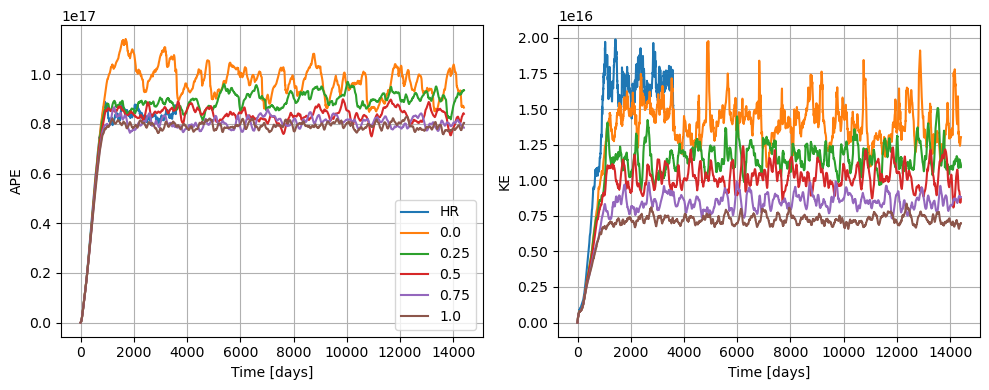

In [37]:
plt.figure(figsize=(10, 4))
r = '20'
plt.subplot(121)
ds_HR['oce_stats'].APE.sum('Interface').plot(label='HR')
for c in C_ANN:
    exp_stats['ANN'][r][str(c)]['oce_stats'].APE.sum('Interface').plot(label=c)
plt.grid()
plt.legend()

plt.subplot(122)
ds_HR['oce_stats'].KE.sum('Layer').plot(label='HR')
for c in C_ANN:
    exp_stats['ANN'][r][str(c)]['oce_stats'].KE.sum('Layer').plot()
plt.grid()

plt.tight_layout()

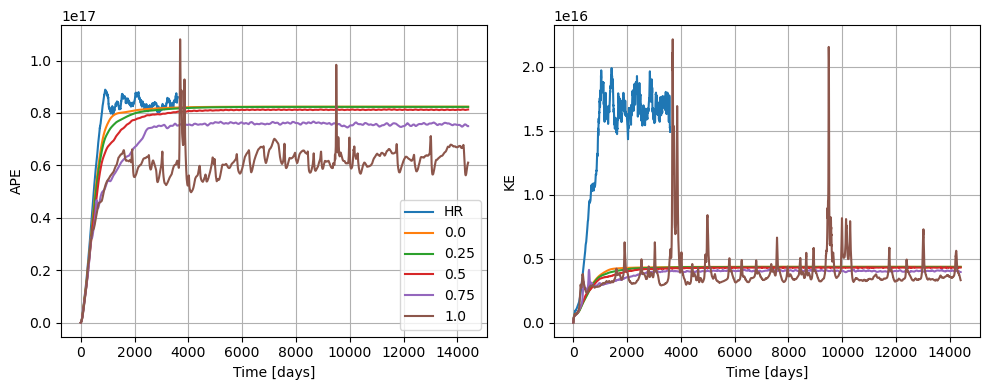

In [43]:
plt.figure(figsize=(10, 4))
r = '80'
plt.subplot(121)
ds_HR['oce_stats'].APE.sum('Interface').plot(label='HR')
for c in C_ANN:
    exp_stats['ANN'][r][str(c)]['oce_stats'].APE.sum('Interface').plot(label=c)
plt.grid()
plt.legend()

plt.subplot(122)
ds_HR['oce_stats'].KE.sum('Layer').plot(label='HR')
for c in C_ANN:
    exp_stats['ANN'][r][str(c)]['oce_stats'].KE.sum('Layer').plot()
plt.grid()

plt.tight_layout()

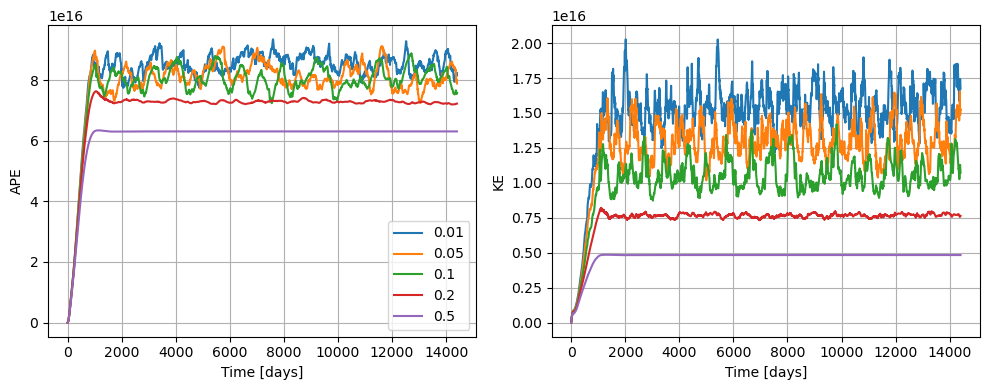

In [41]:
plt.figure(figsize=(10, 4))

plt.subplot(121)
for c in C_GM:
    exp_stats['GM1000'][r][str(c)]['oce_stats'].APE.sum('Interface').plot(label=c)
plt.grid()
plt.legend()

plt.subplot(122)
for c in C_GM:
    exp_stats['GM1000'][r][str(c)]['oce_stats'].KE.sum('Layer').plot()
plt.grid()

plt.tight_layout()

In [69]:
def add_mean_e(ds):
    if 'Time_bnds' in ds: 
        ds = ds.copy()

        Tsel = slice(5*360, None)

        ds['ave_e'] = ds.e.sel(Time=Tsel).mean('Time')

    else:
        pass
    
    return ds

In [71]:
def add_mean_e_HR(ds):
    Tsel = slice(5*360, None)

    ds['ave_e'] = ds.e.sel(Time=Tsel).mean('Time')
    return ds

In [70]:
exp_tree = exp_tree.map_over_subtree(add_mean_e)

In [72]:
ds_HR['prog'] = add_mean_e_HR(ds_HR['prog'])

In [106]:
def add_RMSE_e_mean(ds, ds_HR=ds_HR['prog']): 
    
    
    if 'Time_bnds' in ds: 
        coarsen_points = int(len(ds_HR.xh)/len(ds.xh))
        print(coarsen_points)
        ds_HR_coarse = ds_HR.coarsen(xh=coarsen_points, yh=coarsen_points, boundary='trim').mean()
        ds = ds.copy()

        xh_LR = ds.xh
        yh_LR = ds.yh

        ds['RMSE_ave_e'] = (((ds.ave_e - ds_HR_coarse.ave_e.interp(xh=xh_LR, yh=yh_LR))**2 ).mean(['xh','yh']))**0.5

    else:
        pass

    return ds

In [107]:
import warnings
warnings.filterwarnings("ignore")

In [108]:
exp_tree = exp_tree.map_over_subtree(add_RMSE_e_mean)

2
2
2
2
2
4
4
4
4
4
8
8
8
8
8
16
16
16
16
16
2
2
2
2
2
4
4
4
4
4
8
8
8
8
8
16
16
16
16
16


In [112]:
exp_tree['ANN']['10']['1.0']['ave_prog'].RMSE_ave_e.isel(zi=0).values

array(0.12611451)

In [111]:
exp_tree['ANN']['20']['1.0']['ave_prog'].RMSE_ave_e.isel(zi=0).values

array(0.15524949)

In [109]:
exp_tree['ANN']['40']['1.0']['ave_prog'].RMSE_ave_e.isel(zi=0).values

array(0.18858447)

In [110]:
exp_tree['ANN']['80']['1.0']['ave_prog'].RMSE_ave_e.isel(zi=0).values

array(0.23143232)

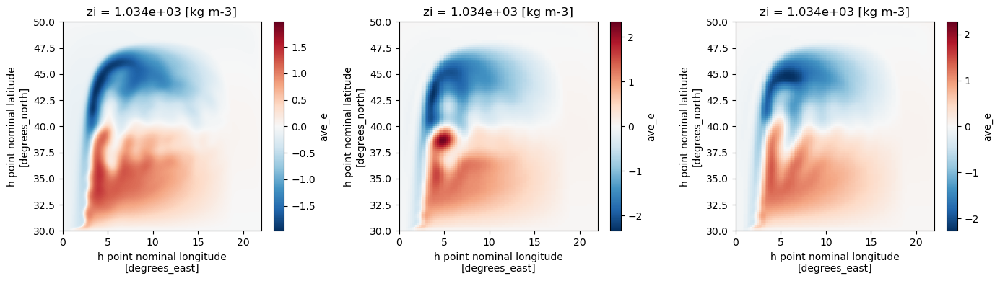

In [73]:
plt.figure(figsize=(14, 4))

plt.subplot(131)
ds_HR['prog'].ave_e.isel(zi=0).plot()

plt.subplot(132)
exp_tree['ANN']['20']['0.0']['ave_prog'].ave_e.isel(zi=0).plot()

plt.subplot(133)
exp_tree['ANN']['20']['0.75']['ave_prog'].ave_e.isel(zi=0).plot()

plt.tight_layout()

In [100]:
xh_80 = exp_tree['ANN']['80']['0.75']['ave_prog'].ave_e.xh
yh_80 = exp_tree['ANN']['80']['0.75']['ave_prog'].ave_e.yh

In [101]:
test = ds_HR['prog'].ave_e.coarsen(xh=16, yh=16, boundary='trim').mean().interp(xh=xh_80, yh=yh_80)

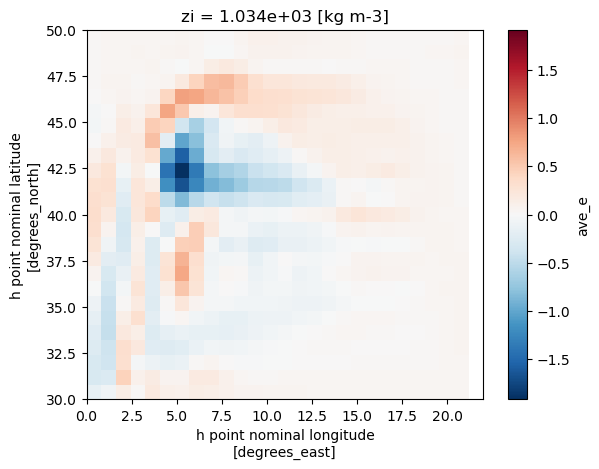

In [105]:
(exp_tree['ANN']['80']['0.75']['ave_prog'].ave_e - test).isel(zi=0).plot()

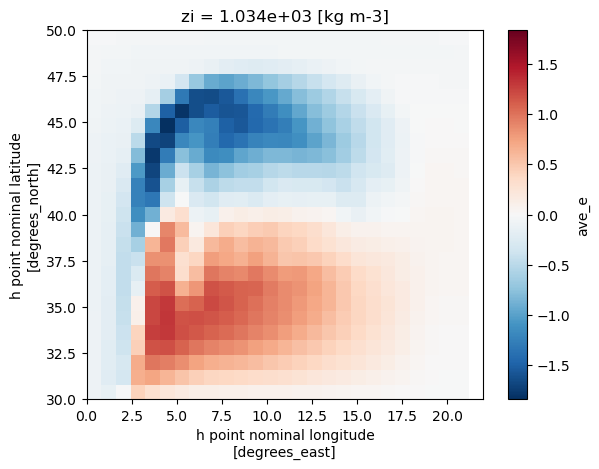

In [104]:
test.isel(zi=0).plot()

In [14]:
files_to_load = ['prog','ave_prog','oce_stats']

In [10]:
def add_PE_reduction_rate(ds): 
    if 'RV' in ds: 
        ds = ds.copy()

        ds['APE_reduce_rate'] = (ds.Fx * ds.dhdx + ds.Fy * ds.dhdy).isel(zl=1).isel(Time=slice(72, None)).mean('Time')
    else: 
        pass
    return ds

In [11]:
exp_tree_test = exp_tree_test.map_over_subtree(add_PE_reduction_rate)

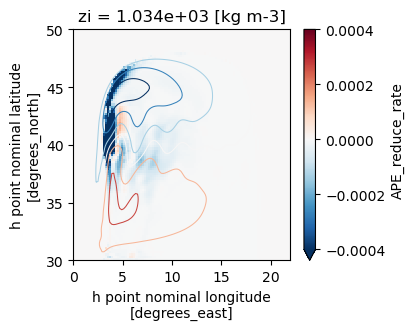

In [13]:
plt.figure(figsize=(3.5,3))
exp_tree_test['ANN']['20']['1.0']['prog'].APE_reduce_rate.plot(vmin = -4e-4)

exp_tree_test['ANN']['20']['1.0']['ave_prog'].e.isel(Time=slice(72, None), zi=0).mean('Time').plot.contour(levels=np.linspace(-1.8, 1.8, 7), linewidths=0.75)
#plt.savefig('sim_100km.png')

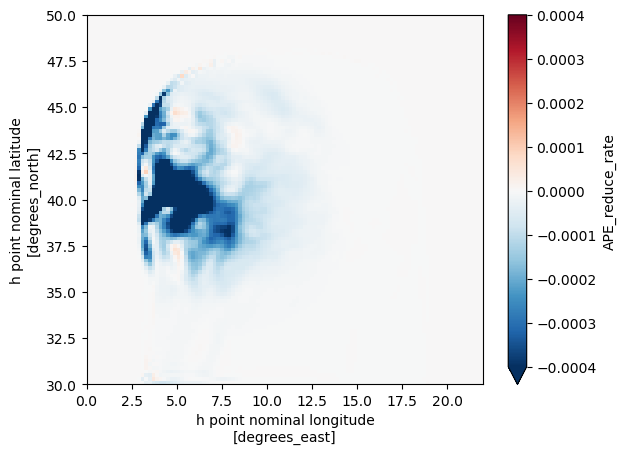

In [20]:
exp_tree_test['ANN']['20']['0.25']['prog'].APE_reduce_rate.plot(vmin = -4e-4)


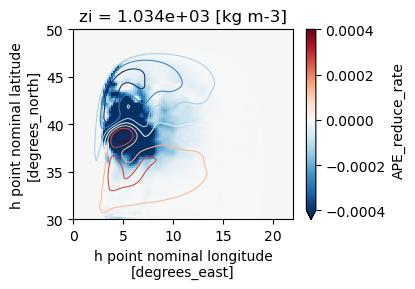

In [27]:
plt.figure(figsize=(4.2,3))
exp_tree_test['ANN']['20']['0.0']['prog'].APE_reduce_rate.plot(vmin = -4e-4)

exp_tree_test['ANN']['20']['0.0']['ave_prog'].e.isel(Time=slice(72, None), zi=0).mean('Time').plot.contour(levels=np.linspace(-1.8, 1.8, 7), linewidths=0.75)
plt.tight_layout()
plt.savefig('sim_100km_DG_0.png')

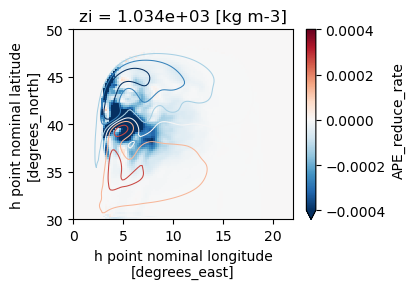

In [28]:
plt.figure(figsize=(4.2,3))
exp_tree_test['ANN']['20']['0.25']['prog'].APE_reduce_rate.plot(vmin = -4e-4)

exp_tree_test['ANN']['20']['0.25']['ave_prog'].e.isel(Time=slice(72, None), zi=0).mean('Time').plot.contour(levels=np.linspace(-1.8, 1.8, 7), linewidths=0.75)
plt.tight_layout()

plt.savefig('sim_100km_DG_p25.png')

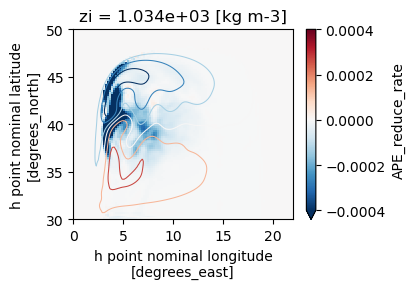

In [29]:
plt.figure(figsize=(4.2,3))
exp_tree_test['ANN']['20']['0.5']['prog'].APE_reduce_rate.plot(vmin = -4e-4)

exp_tree_test['ANN']['20']['0.5']['ave_prog'].e.isel(Time=slice(72, None), zi=0).mean('Time').plot.contour(levels=np.linspace(-1.8, 1.8, 7), linewidths=0.75)
plt.tight_layout()

plt.savefig('sim_100km_DG_p5.png')

In [24]:
def add_transport_metrics(ds): 
    if 'Time_bnds' in ds: 
        ds = ds.copy()

        Tsel = slice(72, None) 

        m3_to_Sv = 1e-6

        ds['Vbar_resolved'] = ds.vh.isel(Time=Tsel).mean('Time').sum('xh') * m3_to_Sv
        ds['Vbar_param'] = ds.vhTrANN.isel(Time=Tsel).mean('Time').sum('xh') * m3_to_Sv
        ds['Vbar_total'] = ds['Vbar_resolved'] + ds['Vbar_param'] 
    else:
        pass
    return ds

In [25]:
def APE(interface):
    '''
    Returns APE in units of kinetic energy per unit mass, i.e.
    m^3/s^2
    '''
    #interface_rest = xr.DataArray([    0.,   -25.,   -75.,  -175.,  -300.,  -450.,  -625.,  -825.,
    #   -1050., -1300., -1600., -1950., -2350., -2850., -3400., -4000.], dims='zi')
    #g = xr.DataArray([1.0e+01, 2.1e-03, 3.9e-03, 5.4e-03, 5.8e-03, 5.8e-03, 5.7e-03,
    #   5.3e-03, 4.8e-03, 4.2e-03, 3.7e-03, 3.1e-03, 2.4e-03, 1.7e-03,
    #   1.1e-03, 0.0e+00], dims='zi')
    interface_rest = xr.DataArray([0. , -1000., -2000.], dims='zi')
    g = xr.DataArray([9.8e-01, 9.8e-03, 9.8e+01], dims='zi')
    
    coordinate_of_bottom = interface.isel(zi=-1).drop_vars(['zi'])
    
    hint = interface - interface_rest
    
    # Where bottom is upper than the rest interface
    hbot = np.maximum(coordinate_of_bottom - interface_rest,0)
    
    APE_instant = (0.5 * g * (hint**2))
    APE_constant = (0.5 * g * (hbot**2))
    
    return (APE_instant - APE_constant).sum('zi')

In [29]:
def add_energy_metrics(ds): 

    if 'RV' in ds: 
        ds = ds.copy()

        ds = ds.isel(xq=slice(1,None), yq=slice(1,None))
        
        grid = Grid(ds, coords={'X': {'center': 'xh', 'right': 'xq'},
                        'Y': {'center': 'yh', 'right': 'yq'},
                        'Z': {'inner': 'zl', 'outer': 'zi'} }, periodic=None)

        dx = ds.xh.diff('xh').values[0] * 1e3
        dA = dx*dx
        
        ds['KE'] = (0.5 * ( grid.interp(ds.u, 'X', boundary='fill')**2 +  
                      grid.interp(ds.v, 'Y', boundary='fill')**2 ) * 
                      ds.h * dA * ds.zl).sum('zl').sum(['xh','yh'])
        
        ds_mean = ds.isel(Time=slice(72, None)).mean('Time')
        
        ds['MKE'] = (0.5 * ( grid.interp(ds_mean.u, 'X', boundary='fill')**2 +  
                         grid.interp(ds_mean.v, 'Y', boundary='fill')**2 ) 
                      * ds_mean.h * dA * ds.zl).sum('zl').sum(['xh','yh'])

        ds['EKE'] = ds['KE'] - ds['MKE']

        ds['APE'] = (APE(ds.e)* 1031.*dA).sum(['xh', 'yh'])
        ds['MAPE'] = (APE(ds_mean.e)* 1031.*dA).sum(['xh', 'yh'])
        
        ds['EAPE'] = ds['APE'] - ds['MAPE']
        
        
    else:
        pass

    return ds

In [27]:
exp_tree_test = exp_tree_test.map_over_subtree(add_transport_metrics)

In [30]:
exp_tree_test = exp_tree_test.map_over_subtree(add_energy_metrics)

In [35]:
def add_PE_reduction_rate(ds): 
    if 'RV' in ds: 
        ds = ds.copy()

        ds['APE_reduce_rate'] = (ds.Fx * ds.dhdx + ds.Fy * ds.dhdy).isel(zl=1).isel(Time=slice(72, None)).mean('Time')
    else: 
        pass
    return ds

In [41]:
test1 = exp_tree_test['ANN']['20']['0.0']['prog']
test2 = exp_tree_test['ANN']['20']['1.0']['prog']

In [42]:
test1 = add_PE_reduction_rate(test1)
test2 = add_PE_reduction_rate(test2)

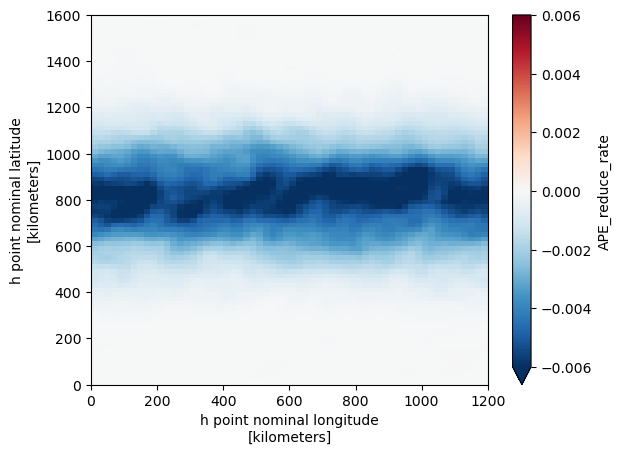

In [45]:
test1.APE_reduce_rate.plot(vmin = -6e-3)

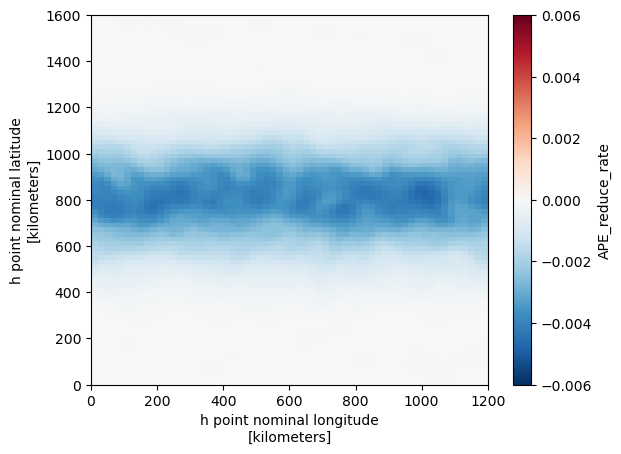

In [46]:
test2.APE_reduce_rate.plot(vmin = -6e-3)

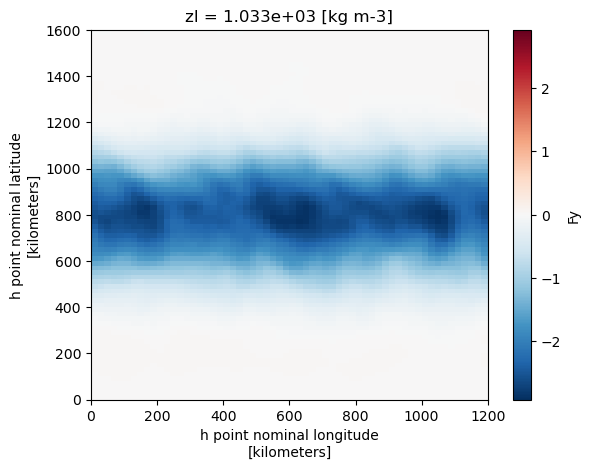

In [34]:
exp_tree_test['ANN']['20']['1.0']['prog'].Fy.isel(Time=slice(72, None), zl=1).mean('Time').plot()

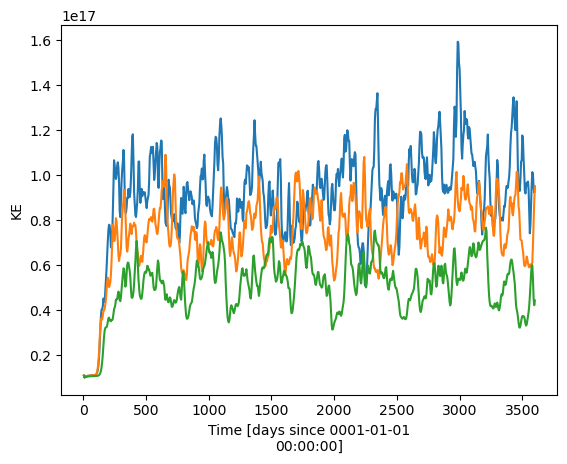

In [31]:
exp_tree_test['ANN']['20']['0.0']['prog'].KE.plot()
exp_tree_test['ANN']['20']['1.0']['prog'].KE.plot()
exp_tree_test['GM1000']['20']['1.0']['prog'].KE.plot()

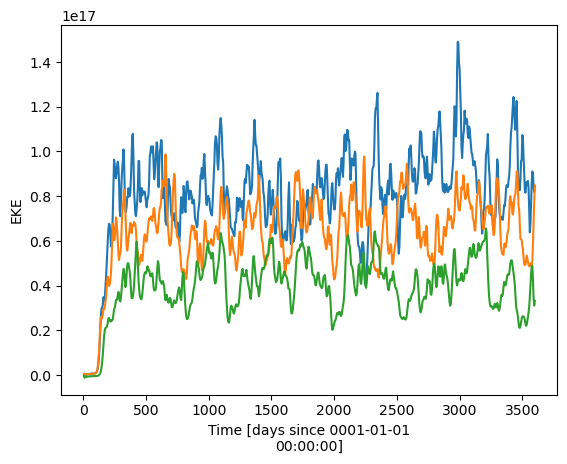

In [114]:
exp_tree_test['ANN']['20']['0.0']['prog'].EKE.plot()
exp_tree_test['ANN']['20']['1.0']['prog'].EKE.plot()
exp_tree_test['GM1000']['20']['1.0']['prog'].EKE.plot()

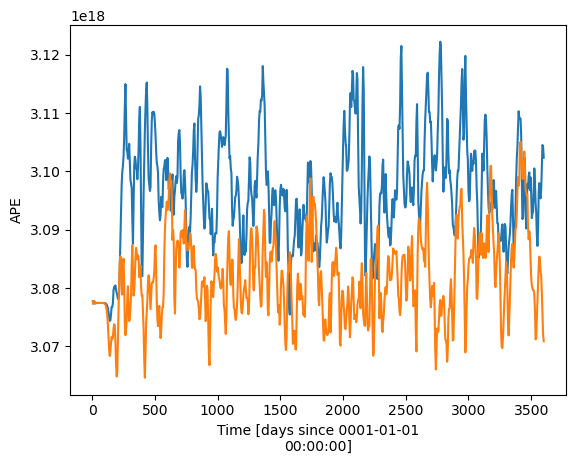

In [115]:
exp_tree_test['ANN']['20']['0.0']['prog'].APE.plot()
exp_tree_test['ANN']['20']['1.0']['prog'].APE.plot()

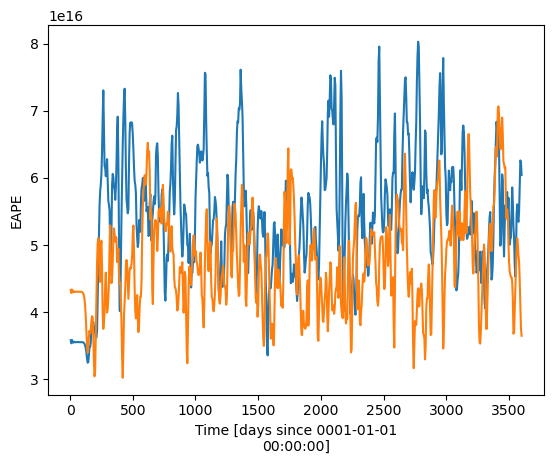

In [116]:
exp_tree_test['ANN']['20']['0.0']['prog'].EAPE.plot()
exp_tree_test['ANN']['20']['1.0']['prog'].EAPE.plot()

In [ ]:
MKE = np.zeros((len(res), len(C_ANN), len(model_types)),)
EKE = np.zeros_like(MKE)

MAPE = np.zeros_like(MKE)
EAPE = np.zeros_like(MKE)

for k, ANN_type in enumerate(model_types): 
    for i, r in enumerate(res):
        if ANN_type == 'ANN':
            C = C_ANN
        elif ANN_type == 'GM1000':
            C = C_GM

        for j, coeff in enumerate(C): 
            MKE[i,j,k] = exp_tree_test[ANN_type][str(r)][str(coeff)]['prog'].MKE.values
            EKE[i,j,k] = exp_tree_test[ANN_type][str(r)][str(coeff)]['prog'].EKE.isel(Time=slice(72, None)).mean('Time').values

            MAPE[i,j,k] = exp_tree_test[ANN_type][str(r)][str(coeff)]['prog'].MAPE.values
            EAPE[i,j,k] = exp_tree_test[ANN_type][str(r)][str(coeff)]['prog'].EAPE.isel(Time=slice(72, None)).mean('Time').values



In [ ]:
exp_tree_test['ANN']['20']['0.0']['prog'].KE.plot()

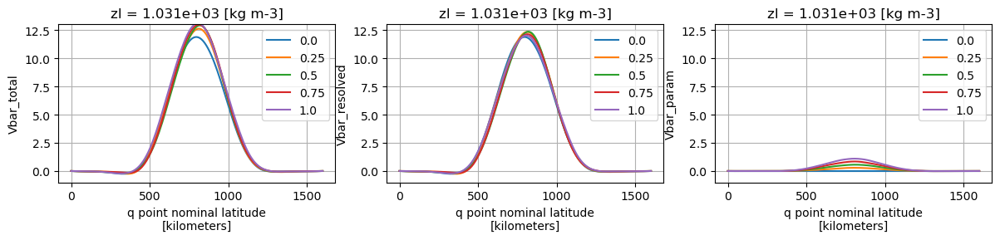

In [71]:
plt.figure(figsize=(12, 3))

Lscale = '10'

plt.subplot(131)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

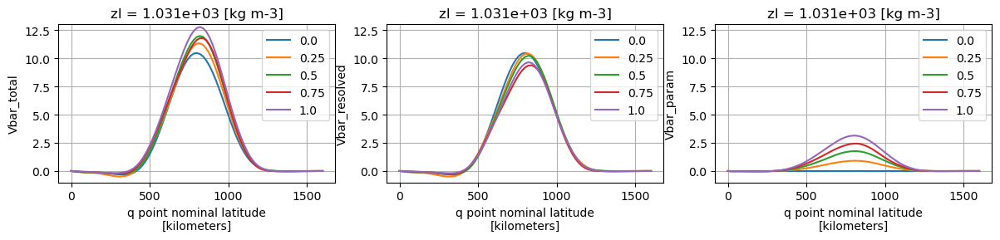

In [67]:
plt.figure(figsize=(12, 3))

Lscale = '20'

plt.subplot(131)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

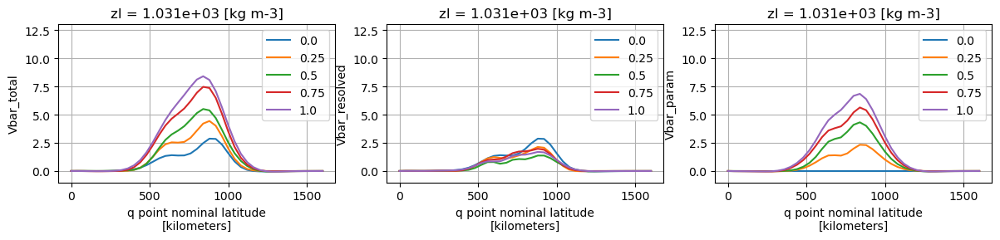

In [69]:
plt.figure(figsize=(12, 3))

Lscale = '40'

plt.subplot(131)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

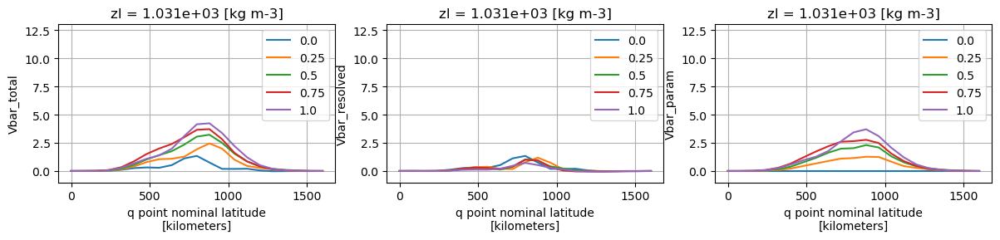

In [70]:
plt.figure(figsize=(12, 3))

Lscale = '80'

plt.subplot(131)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_ANN:
    exp_tree_test['ANN'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

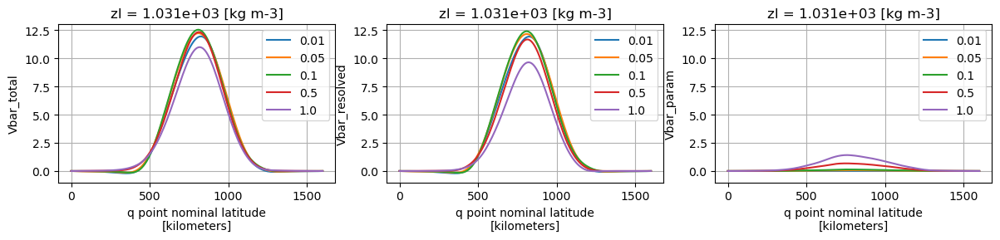

In [72]:
plt.figure(figsize=(12, 3))

Lscale = '10'

plt.subplot(131)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

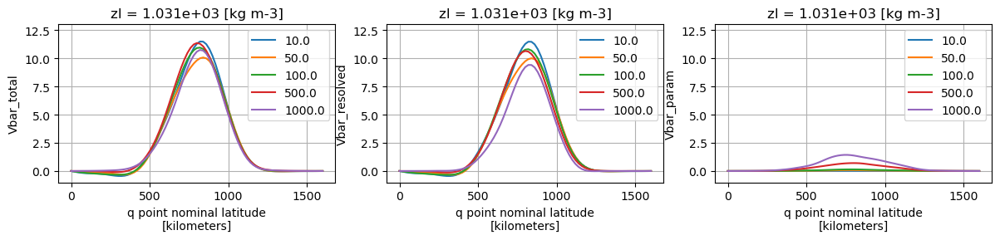

In [73]:
plt.figure(figsize=(12, 3))

Lscale = '20'

plt.subplot(131)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

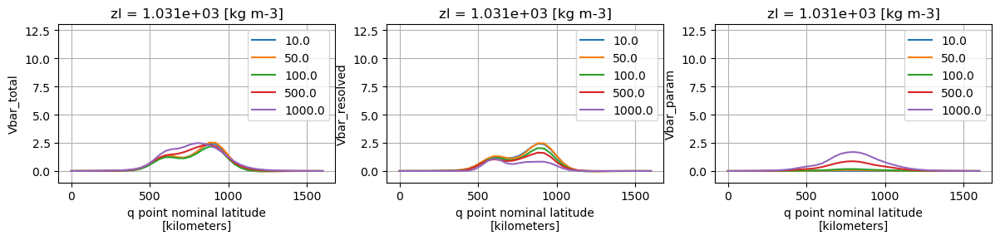

In [74]:
plt.figure(figsize=(12, 3))

Lscale = '40'

plt.subplot(131)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

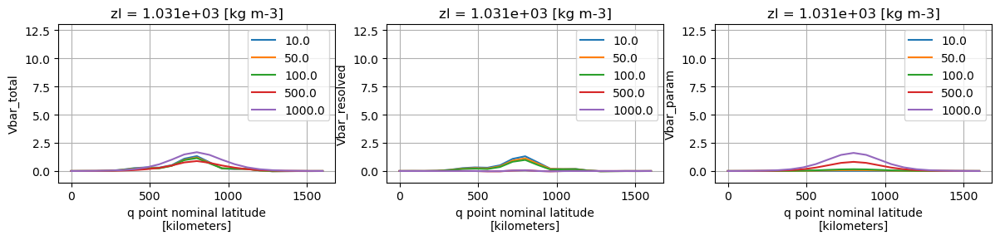

In [75]:
plt.figure(figsize=(12, 3))

Lscale = '80'

plt.subplot(131)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_total.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(132)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_resolved.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.subplot(133)
for c in C_GM:
    exp_tree_test['GM1000'][Lscale][str(c)]['ave_prog'].Vbar_param.isel(zl=0).plot(label = c*1000)
    plt.legend()
plt.ylim([-1, 13])
plt.grid()

plt.tight_layout()

## OLD


In [3]:
scales = ['10','20','30','40','80']
#C = ['0.1','0.25','0.5','1']
Cvals = ['0','0.1','0.25','0.3','0.4','0.5','0.6','0.7','0.75','1']

scales_array = np.array(scales, dtype=float)
Cvals_array = np.array(Cvals, dtype=float)

In [4]:
ds_no_param_dic = {}
create_leaf(ds_no_param_dic, ['04'],analyze_sims('/scratch/db194/mom6/tests_Phillips_2layer/generate_training_data/Phillips_2layer_4km_10day/'))

ERROR 1: PROJ: proj_create_from_database: Open of /ext3/miniforge/share/proj failed


In [5]:
ds_ANN_dic = {}

dir = '/scratch/db194/mom6/tests_Phillips_2layer/tests_actual_ANN/tests_local_para_perp_arch_11mar_2024/Phillips_2layer_'
for L in scales:
    print(L)
    for c in Cvals:
        if c == '0': 
            dir_case= '/scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_'+L+'km/'
        elif c == '1': 
            dir_case = dir + L+'km_ANN_FGR5/'
        elif c == '0.25' or c == '0.75':
            intp = str(int(float(c)*100))
            dir_case = dir + L+'km_ANN_FGR5_Cperp_p'+intp+'_Cpara_p'+intp+'/'
        else: 
            intp = str(int(float(c)*10))
            dir_case = dir + L+'km_ANN_FGR5_Cperp_p'+intp+'_Cpara_p'+intp+'/'
            
        #print(c)
        #print(dir_case)
        
        create_leaf(ds_ANN_dic, [L, c], analyze_sims(dir_case))
            
   
   

10
20
30
40
80


### Overturning

In [6]:
OT_max = np.zeros((len(scales_array), len(Cvals)) )
OT_resolved = np.zeros((len(scales_array), len(Cvals)) )
OT_param = np.zeros((len(scales_array), len(Cvals)) )

for i, L in enumerate(scales): 
    for j, c in enumerate(Cvals):
        
        ds = ds_ANN_dic[L][c] 
    
        OT = ds.Vbar_total.sel(Time=slice(360, None)).mean('Time')
        OT_max[i,j] = OT.max().values

        OT_resolved[i,j] = ds.Vbar_resolved.sel(Time=slice(360, None)).mean('Time').max().values
        OT_param[i,j] = ds.Vbar_param.sel(Time=slice(360, None)).mean('Time').max().values
        #OT.plot(label=L+'km')

#plt.legend()
#plt.ylabel('Overturning [Sv]')
#plt.xlabel('y [km]')

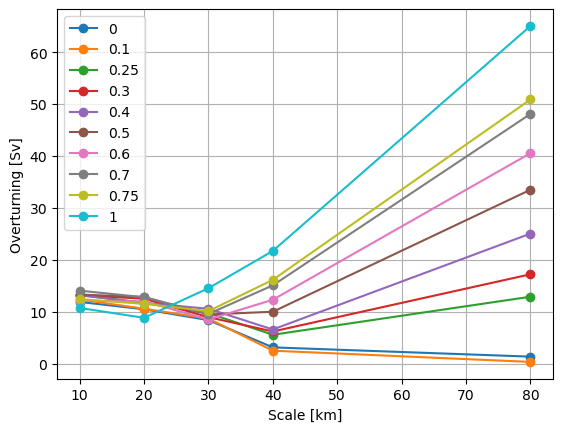

In [7]:
for j,c in enumerate(Cvals):
    plt.plot(scales_array, OT_max[:,j], marker='o', label=c)
plt.xlabel('Scale [km]')
plt.ylabel('Overturning [Sv]')
plt.grid()
plt.legend()


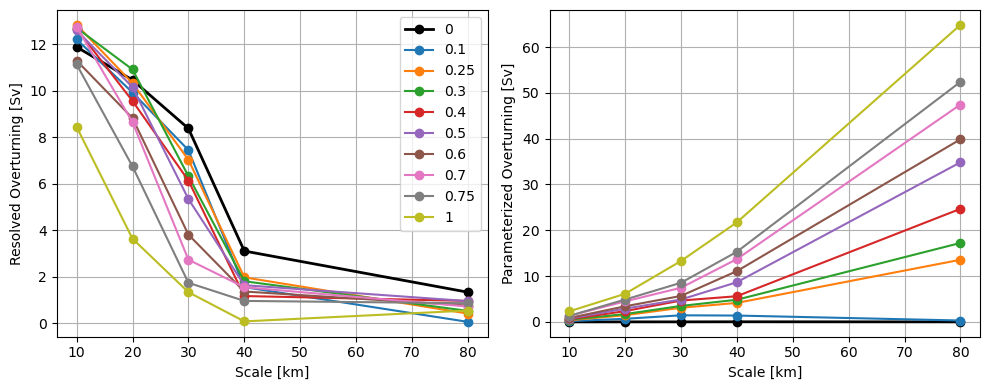

In [22]:
plt.figure(figsize=(10,4))

plt.subplot(121)
for j,c in enumerate(Cvals):
    if c == '0':
        
        plt.plot(scales_array, OT_resolved[:,j], marker='o', label=c, color='k', linewidth=2)
    else:
        plt.plot(scales_array, OT_resolved[:,j], marker='o', label=c)
plt.xlabel('Scale [km]')
plt.ylabel('Resolved Overturning [Sv]')
plt.grid()
plt.legend()

plt.subplot(122)
for j,c in enumerate(Cvals):
    if c =='0':
        plt.plot(scales_array, OT_param[:,j], marker='o', label=c, color='k', linewidth=2)
    else:
        plt.plot(scales_array, OT_param[:,j], marker='o', label=c)
plt.xlabel('Scale [km]')
plt.ylabel('Parameterized Overturning [Sv]')
plt.grid()
#plt.legend()

plt.tight_layout()


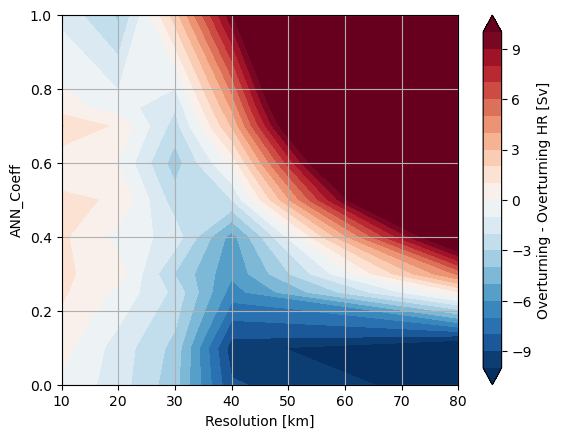

In [10]:
plt.contourf(scales_array, Cvals_array, OT_max.T-12, levels=np.linspace(-10,10,21), vmin=-10, vmax=10, cmap='RdBu_r', extend='both')
plt.colorbar(label='Overturning - Overturning HR [Sv]')
plt.xlabel('Resolution [km]')
plt.ylabel('ANN_Coeff')
plt.grid()

Text(0.5, 0, 'y [km]')

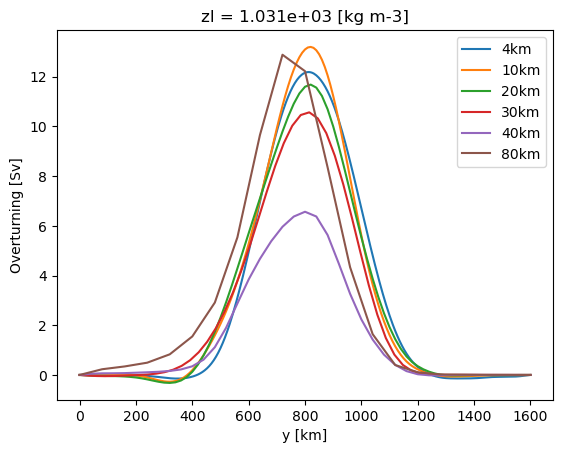

In [13]:

OT = ds_no_param_dic['04'].Vbar_total.sel(Time=slice(360, None)).mean('Time')
OT.plot(label='4km')

#c_choice = ['0.5', '0.5', '0.5', '0.5','0.25']
c_choice = ['0.4', '0.4', '0.4', '0.4','0.25']
#['0.1','0.25','0.5','0.75','1']
for i, L in enumerate(scales): 
    #for j, c in enumerate(Cvals):
        c = c_choice[i]   
        ds = ds_ANN_dic[L][c] 
    
        OT = ds.Vbar_total.sel(Time=slice(360, None)).mean('Time')
        #OT_max[i,j] = OT.max().values
        OT.plot(label=L+'km')

plt.legend()
plt.ylabel('Overturning [Sv]')
plt.xlabel('y [km]')

Text(0.5, 0, 'y [km]')

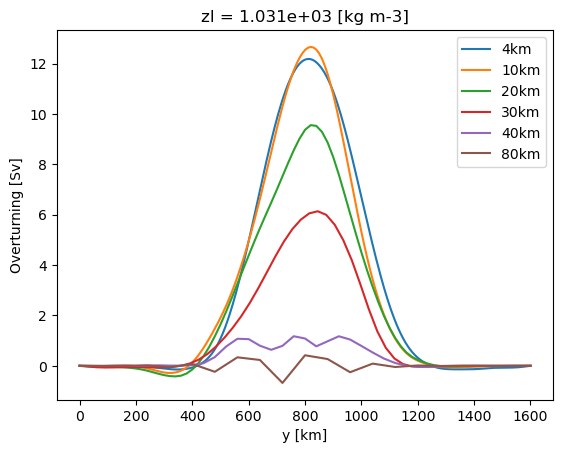

In [15]:

OT = ds_no_param_dic['04'].Vbar_resolved.sel(Time=slice(360, None)).mean('Time')
OT.plot(label='4km')

#c_choice = ['1', '0.75', '0.75', '0.5','0.25']
#['0.1','0.25','0.5','0.75','1']
for i, L in enumerate(scales): 
    #for j, c in enumerate(Cvals):
        c = c_choice[i]   
        ds = ds_ANN_dic[L][c] 
    
        OT = ds.Vbar_resolved.sel(Time=slice(360, None)).mean('Time')
        #OT_max[i,j] = OT.max().values
        OT.plot(label=L+'km')

plt.legend()
plt.ylabel('Overturning [Sv]')
plt.xlabel('y [km]')

Text(0.5, 0, 'y [km]')

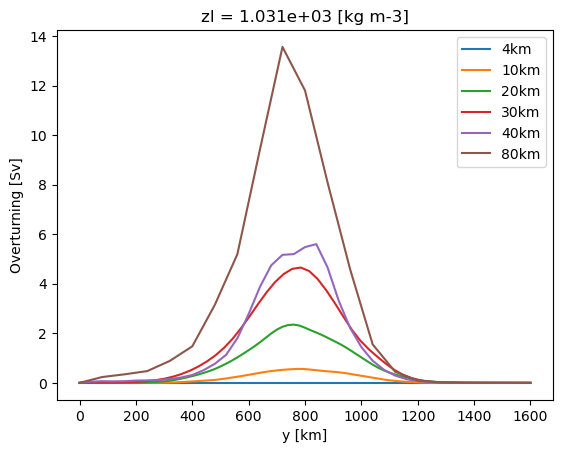

In [16]:

OT = ds_no_param_dic['04'].Vbar_param.sel(Time=slice(360, None)).mean('Time')
OT.plot(label='4km')

#c_choice = ['1', '0.75', '0.75', '0.5','0.25']
#['0.1','0.25','0.5','0.75','1']
for i, L in enumerate(scales): 
    #for j, c in enumerate(Cvals):
        c = c_choice[i]   
        ds = ds_ANN_dic[L][c] 
    
        OT = ds.Vbar_param.sel(Time=slice(360, None)).mean('Time')
        #OT_max[i,j] = OT.max().values
        OT.plot(label=L+'km')

plt.legend()
plt.ylabel('Overturning [Sv]')
plt.xlabel('y [km]')

## Mean state

In [85]:
common_y = np.linspace(100, 1500, 101) 
hmean_HR = ds_no_param_dic['04'].prog.e.isel(zi=1).mean('xh').sel(Time=slice(360, None)).mean('Time')
hmean_HR_int = hmean_HR.interp(yh=common_y)

Text(0.5, 0, 'y [km]')

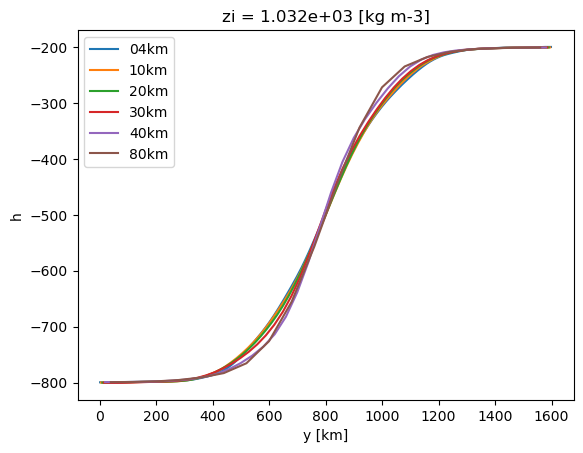

In [86]:
hmean_err = np.zeros_like(scales_array)

for i, L in enumerate(scales): 
    ds = ds_no_param_dic[L] 

    hmean = ds.prog.e.isel(zi=1).mean('xh').sel(Time=slice(360, None)).mean('Time')
    hmean_int = hmean.interp(yh=common_y)
    hmean_err[i] = (((hmean_int - hmean_HR_int)**2).mean('yh'))**0.5
    hmean.plot(label=L+'km')

plt.legend()
plt.ylabel('h')
plt.xlabel('y [km]')

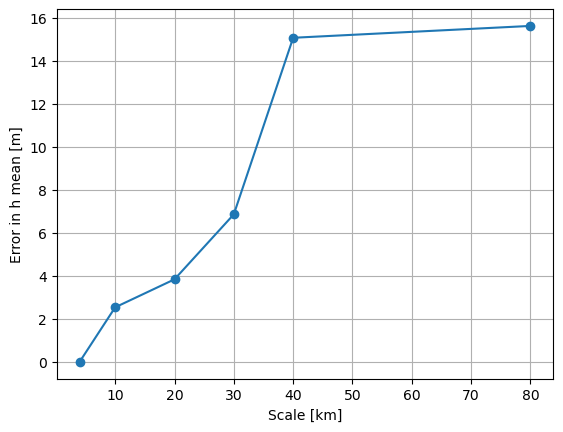

In [87]:
plt.plot(scales_array, hmean_err, marker='o')
plt.xlabel('Scale [km]')
plt.ylabel('Error in h mean [m]')
plt.grid()

## KE and PE

In [98]:
from xgcm import Grid

def KE_HR(ds):
    xgrid = Grid(ds, coords={'X': {'center': 'xh', 'outer': 'xq'},
                             'Y': {'center': 'yh', 'outer': 'yq'},
                             'Z': {'center': 'zl', 'outer': 'zi'} },
                 periodic=['X'])
    
    Umean = ds.u.mean(['Time','xq'])
    Vmean = ds.v.mean(['Time','xh'])
    
    Up = ds.u - Umean
    Vp = ds.v - Vmean
    
    MKE = 0.5*( Umean**2 + xgrid.interp(Vmean,'Y', boundary='extend')**2)
    EKE = 0.5*( xgrid.interp(Up, 'X')**2 + xgrid.interp(Vp,'Y', boundary='extend')**2).mean(['Time','xh'])

    return MKE.mean(['yh','zl']).values, EKE.mean(['yh','zl']).values

def PE_HR(ds): 

    gr = np.zeros(3)
    gr[0] = 9.81
    gr[1] = gr[0] * (ds.zl[1] - ds.zl[0])/ds.zl[0]
    gr[2] = 0.

    ds['gr'] = xr.DataArray(gr, dims={'zi'})

    eGlobMean = ds.e.mean(['Time','xh','yh'])
    eMean = ds.e.mean(['Time','xh']) - eGlobMean

    PE = (0.5* ds.gr * (ds.e - eGlobMean)**2).sum('zi').mean(['Time','xh','yh'])
    MPE = (0.5* ds.gr * eMean**2).sum('zi').mean(['yh'])
    EPE = PE - MPE

    return MPE, EPE

In [100]:
ds_no_param_dic

{'04': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/generate_training_data/Phillips_2layer_4km_10day/,
 '10': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_10km/,
 '20': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_20km/,
 '30': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_30km/,
 '40': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_40km/,
 '80': Data for sim at: /scratch/db194/mom6/tests_Phillips_2layer/Phillips_2layer_80km/}

In [102]:
MKE = np.zeros_like(scales_array)
EKE = np.zeros_like(scales_array)

MPE = np.zeros_like(scales_array)
EPE = np.zeros_like(scales_array)

for i, L in enumerate(scales): 
    print(L)
    ds = ds_no_param_dic[L].prog

    
    MKE[i], EKE[i] = KE_HR(ds.sel(Time=slice(360, None)))
    
    MPE[i], EPE[i] = PE_HR(ds.sel(Time=slice(360, None)))

04
10
20
30
40
80


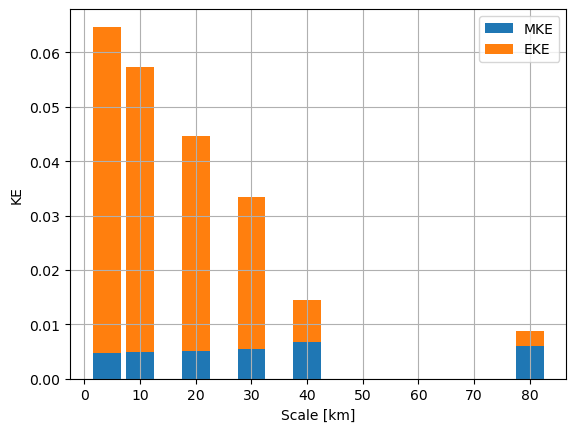

In [97]:
KE = {"MKE":MKE, 
      "EKE":EKE }

width=5
fig, ax = plt.subplots()
bottom = np.zeros(len(scales_array))

for boolean, weight_count in KE.items():
    p = ax.bar(scales_array, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

ax.set_xlabel('Scale [km]')
ax.set_ylabel('KE')
ax.legend(loc='best')
plt.grid()

(500.0, 700.0)

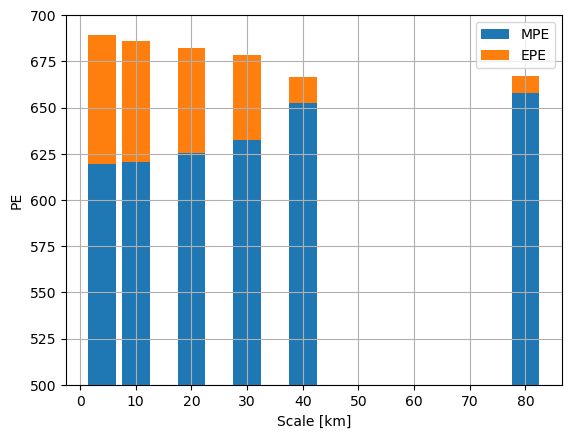

In [105]:
PE = {"MPE":MPE, 
      "EPE":EPE }

width=5
fig, ax = plt.subplots()
bottom = np.zeros(len(scales_array))

for boolean, weight_count in PE.items():
    p = ax.bar(scales_array, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

ax.set_xlabel('Scale [km]')
ax.set_ylabel('PE')
ax.legend(loc='best')
plt.grid()
plt.ylim(500, 700)